# Chapter 5 Experiments

**Purpose**: Run experiments described in Chapter 5 (BCT integration).

These are:
1. **Seasonal VBD infection risk** - rainy vs dry scenarios, calibrated to data
2. **Sensitivity analysis: perceived severity** (across rainy/dry & HBM/PMT)
3. **Sensitivity analysis: initial self-efficacy** (across ONE of rainy/dry & HBM/PMT)

# 0 Imports

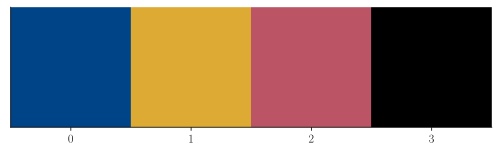

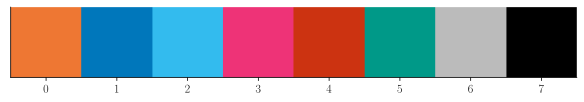

In [1]:
# MPL stuff
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import matplotlib.pyplot as plt

import matplotlib

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.weight": "medium",
    "font.serif": "cmr10",  # cmr10 is part of Computer Modern Roman
    "axes.labelsize": 12,   # Corresponds to 12pt
    "font.size": 12,        # General font size
    "legend.fontsize": 12,  # Legend font size
    "xtick.labelsize": 12,  # X-axis tick label size
    "ytick.labelsize": 12,  # Y-axis tick label size
    'axes.formatter.use_mathtext': True,
    "axes.spines.right": False,
    "axes.spines.top": False,
    "legend.frameon": False,
})

from tol_colors import tol_cmap, tol_cset
cmap = tol_cset('vibrant')

import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm


# Model stuff -- using BCTs
import sys
sys.path.append("../../models/bcts")
from model.model     import BaselineModel as ModelHBM
from model_pmt.model import BaselineModel as ModelPMT


# Utils
def derive_mu_sigma_lognormal(mean, variance):
    """Given mu and sigma from a log-normal distribution, find the mean and variance."""
    sigma = np.sqrt(np.log(variance/(mean**2) + 1))
    mu    = np.log(mean) - .5*(sigma**2)
    return mu, sigma

def run_model(Model, n, names, param_sets, debug=True):
    """Run the model for `n` runs per scenario under each name-parameters pair."""
    data = {name: None for name in names}

    for name, params in zip(names, param_sets):
        if debug: print(f"Running scenario '{name}'...")
        
        scenario_res = [None] * n
        for i in tqdm(range(n)):
            m = Model(**params)
            run, _ = m.run()

            scenario_res[i] = run

            # add additional info for number of agents in occupations
            scenario_res[i]["amts"] = (np.sum([a.forest_worker for a in m.agents]),
                                        np.sum([a.field_worker for a in m.agents]),
                                        np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))
        data[name] = scenario_res

    return data


def plot_colours(cmap):
    colors = matplotlib.colors.ListedColormap(cmap)(np.arange(len(cmap)))
    
    # Display the colors
    fig, ax = plt.subplots(figsize=(8, 2))
    ax.imshow([colors], extent=[0, len(cmap), 0, 1])
    ax.set_xticks(np.arange(len(cmap)) + 0.5)
    ax.set_xticklabels(np.arange(len(cmap)))
    ax.set_yticks([])  # Remove y-axis ticks
    plt.show()


def run_similarity_orderings(arrs):
    """Requires `arrs`, a (num_runs) x (num_points) matrix.
    
    Uses Euclidean distances to sort indices in ascending order of
    pairwise distance."""
    dists = np.zeros(len(arrs))
    
    for r in range(len(arrs)):
        dists[r] = np.sqrt(np.sum((np.delete(arrs, r, axis=0) - arrs[r, :])**2, axis=1).sum())

    return np.arange(0, len(arrs))[np.argsort(dists)]


def tricolor(c, amount=0.5):
    """Takes a colour `c`, lightens it, darkens it, and returns [light, `c`, dark]"""
    import colorsys
    
    h, l, s = colorsys.rgb_to_hls(*matplotlib.colors.to_rgb(c))
    c1 = colorsys.hls_to_rgb(h, 1 - amount * (1 - l), s)
    c2 = colorsys.hls_to_rgb(h, 1 - amount * (1 - (1-l)), s)
    
    return [c1, c, c2]


# deriving ideal fig size
pt = 1./72.27
my_width = 426.79135*pt
golden = (1 + 5 ** 0.5) / 2
IDEAL_FIG_SIZE = (my_width, my_width/golden)

matplotlib.rcParams.update({
    "figure.figsize": IDEAL_FIG_SIZE,
    "figure.constrained_layout.use": True,
})

# NOTE: setting seed here.
np.random.seed(1389498)

plot_colours(tol_cset('high-contrast'))
plot_colours(tol_cset('vibrant'))

## 1 Rainy vs Dry

Set up the HBM + PMT models with regular base parameters + derived rainy/dry parameters.

In [3]:
base_params = {
    # old parameters
    "movement_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1, .001)), # high movement
    "sigma_h_arr" : np.array([19, 19, 19]),
    "sigma_v_arr" : np.array([.5, .5, .5]),
    "psi_v_arr" : np.array([.3, .3, .3]),
    "beta_hv_arr" : np.array([.33, .33, .33]),
    "beta_vh_arr" : np.array([.33, .33, .33]),
    "nu_v_arr" : np.array([.1, .1, .1]),
    "mu_v_arr" : np.array([1/14, 1/14, 1/14]),
    "edge_prob" : .03,
    "initial_infect_proportion" : .005,
    "nu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/5, .001)),
    "mu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/6, .001)),
    "total_time" : 200,
    "mosquito_timestep" : .005,

    # custom parameters -- calibrated
    "k" : 3,
    "timestep" : (2/24),
    "patch_densities" : np.array([.85, .08, .07]),
    "num_households" : 2_351,
    "num_agents" : 10_053,
    "K_v_arr" : np.array([2700, 8100, 9450]),
    "patch_init_infect_vector_prop_arr" : [.0, .0, .0],
    "prob_adopt_itn": .0,
    "stay_home_chance": .0,
}

RAINY_SEASON_HBM = base_params.copy()
RAINY_SEASON_HBM.update({
    "high_severity": True,           # high perceived severity of disease when rainy
    "high_barriers": False,          # no barriers when rainy (not hot)
    "high_benefits": True,           # high perceived benefits of ITNs when rainy
    "init_itn_score": 5, # agents start with 1/2 efficacy
})

DRY_SEASON_HBM = base_params.copy()
DRY_SEASON_HBM.update({
    "high_severity": False,           # low perceived severity of disease when dry
    "high_barriers": True,            # high barriers when dry (hot)
    "high_benefits": False,           # low perceived benefits of ITNs when dry
    
    "K_v_arr": base_params["K_v_arr"]/np.array([2.4, 2.4, 1]), # less mosquitoes when dry
    "init_itn_score": 5, # agents start with 1/2 efficacy
})

RAINY_SEASON_PMT = base_params.copy()
RAINY_SEASON_PMT.update({
    "high_severity": True,           # high perceived severity of disease when rainy
    "high_response_costs": False,    # high perceived barriers (response cost) of ITNs when rainy

    "high_response_eff": False,      # dummy values (not used internally)
    "high_self_eff": False, 

    "init_itn_score": 5, # agents start with 1/2 efficacy
})

DRY_SEASON_PMT = base_params.copy()
DRY_SEASON_PMT.update({
    "high_severity": False,          # low perceived severity of disease when dry
    "high_response_costs": True,     # high perceived barriers (response cost) of ITNs when dry (hot)
    
    "high_response_eff": False,      # dummy values (not used internally)
    "high_self_eff": False,

    "init_itn_score": 5, # agents start with 1/2 efficacy
    
    "K_v_arr": base_params["K_v_arr"]/np.array([2.4, 2.4, 1]) # less mosquitoes when dry
})

num_runs = 15

In [4]:
hbm_data = run_model(ModelHBM, num_runs, ['rainy', 'dry'], [RAINY_SEASON_HBM, DRY_SEASON_HBM])

Running scenario 'rainy'...


100%|███████████████████████████████████████████████████████████████████████████| 15/15 [22:38<00:00, 90.59s/it]


Running scenario 'dry'...


100%|███████████████████████████████████████████████████████████████████████████| 15/15 [23:19<00:00, 93.31s/it]


In [5]:
pmt_data = run_model(ModelPMT, num_runs, ['rainy', 'dry'], [RAINY_SEASON_PMT, DRY_SEASON_PMT])

Running scenario 'rainy'...


100%|██████████████████████████████████████████████████████████████████████████| 15/15 [43:56<00:00, 175.78s/it]


Running scenario 'dry'...


100%|██████████████████████████████████████████████████████████████████████████| 15/15 [44:20<00:00, 177.38s/it]


### Overall figure of p(behaviour)

0.9629757557498735
0.9793286092878973
0.4700190302896271
0.15055748971333735


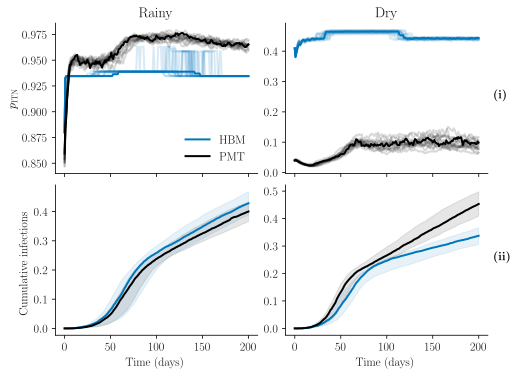

In [92]:
rainy_dry_c = [cmap[1], cmap[7]]
names       = ["Rainy", "Dry"]

fig, axs = plt.subplots(nrows=2, ncols=2, sharey=False, sharex='col', figsize=(IDEAL_FIG_SIZE[0]*1.2, IDEAL_FIG_SIZE[1]*1.4))

def plot_p_behaviour(dfs, ax, colours, names):
    for name, df, c in zip(names, dfs, colours):
        # p itn
        nonzero_idx = df[0]['prob_values'].nonzero()
        vals = np.array([run['prob_values'][nonzero_idx] for run in df])

        mins = np.min(vals, axis=0)
        maxs = np.max(vals, axis=0)
        hl_run = run_similarity_orderings(vals)[0]

        print(np.max(maxs))

        for r_no, run in enumerate(df):
            ax[0].plot(np.array(df[0]["time"])[nonzero_idx],
                    run["prob_values"][nonzero_idx],
                    color=c,
                    lw=2,
                    # lw=2 if hl_run == r_no else 1,
                    alpha=1 if hl_run == r_no else .15,
                    label=name if hl_run == r_no else None)

        # cum infs
        vals = np.array([run["agent_infected_unique"][0:3].sum(axis=0).cumsum()/10053 for run in df])

        mins = np.min(vals, axis=0)
        maxs = np.max(vals, axis=0)
        hl_run = run_similarity_orderings(vals)[0]
        
        ax[1].fill_between(df[0]["time"],
                               mins,
                               maxs,
                               color=c,
                               alpha=.1)

        ax[1].plot(df[0]["time"],
                     vals[hl_run],
                     color=c,
                     lw = 2)
        

plot_p_behaviour([hbm_data["rainy"], pmt_data["rainy"]], axs[:, 0], rainy_dry_c, ["HBM", "PMT"])
plot_p_behaviour([hbm_data["dry"], pmt_data["dry"]], axs[:, 1], rainy_dry_c, ["HBM", "PMT"])

axs[1,0].set_xlabel("Time (days)")
axs[1,1].set_xlabel("Time (days)")
axs[0,0].set_ylabel(r"$p_\mathrm{ITN}$")
axs[1,0].set_ylabel(r"Cumulative infections")

axs[0,1].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
axs[1,1].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")
# axs[1,0].annotate(r"\textbf{(ii)}", xy=(-0.25, 0.925), xycoords="axes fraction")

axs[0,0].set_title("Rainy")
axs[0,1].set_title("Dry")

axs[0,0].legend()
plt.savefig("figs/1-p-behaviour.pdf")

### Cumulative infections per patch

0.33607907742998355
87.99999999999936
0.22746268656716417
80.08333333333314
0.3103570166136444
96.33333333333222
0.3685440523486796
60.83333333333397


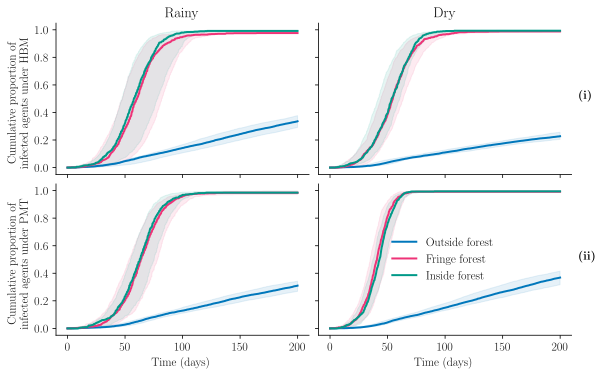

In [93]:
fig, axs = plt.subplots(nrows=2,
                        ncols=2,
                        sharex=True, sharey=True,
                        figsize=(IDEAL_FIG_SIZE[0]*1.4, IDEAL_FIG_SIZE[1]*1.4))

def plot_cum_infections_patches(data_sub, ax, colours, patch_colours=[cmap[1], cmap[3], cmap[5]], patch_labels=["Outside forest", "Fringe forest", "Inside forest"]):
    # for i, risk_group in enumerate(["Forest workers", "Field workers", "Non-workers"]):
    #     cum_infs = np.array([data[r]["agent_infected_unique"][i].cumsum()/data[r]['amts'][i] for r in range(len(data))])

    #     mins = np.min(cum_infs, axis=0)
    #     maxs = np.max(cum_infs, axis=0)
    #     ax.fill_between(data[0]["time"],
    #                        mins,
    #                        maxs,
    #                        color=colours[i],
    #                        alpha=.1)

    #     hl_run = run_similarity_orderings(cum_infs)[0]
    #     ax.plot(data[0]["time"],
    #             data[hl_run]["agent_infected_unique"][i].cumsum()/data[hl_run]['amts'][i],
    #             linewidth=2,
    #             color=colours[i],
    #             label=risk_group)

    for patch_id, c, patch_l in zip(range(3), patch_colours, patch_labels):
        # compute cumsums for runs
        cumsums = np.zeros((len(data_sub), 2400))
        for r in range(len(data_sub)):
            df = pd.DataFrame(data_sub[r]["infection_records"])
            df = df[df.home_patch == patch_id].groupby(by=["time"]).size().reset_index()
            cumsums[r, df.time] = df.iloc[:, 1]
            cumsums[r] = cumsums[r].cumsum()/data_sub[r]["agent_group_pops"][patch_id]
        
        mins = np.min(cumsums, axis=0)
        maxs = np.max(cumsums, axis=0)
        ax.fill_between(data_sub[0]["time"],
                               mins,
                               maxs,
                               color=c,
                               alpha=.1)

        hl_run = run_similarity_orderings(cumsums)[0]
        ax.plot(data_sub[0]["time"],
                cumsums[hl_run],
                color=c,
                linewidth=2,
                label=patch_l)
        if patch_id == 2: print(data_sub[0]["time"][np.argmax(cumsums[hl_run] > 0.95)])
        if patch_id == 0: print(cumsums[hl_run][-1])


risk_group_colours = [cmap[5], cmap[0], cmap[7]]

plot_cum_infections_patches(hbm_data['rainy'], axs[0,0], risk_group_colours)
plot_cum_infections_patches(hbm_data['dry'], axs[0,1], risk_group_colours)
axs[0,0].set_ylabel("Cumulative proportion of\ninfected agents under HBM")
axs[0,0].set_title("Rainy")

plot_cum_infections_patches(pmt_data['rainy'], axs[1,0], risk_group_colours)
plot_cum_infections_patches(pmt_data['dry'], axs[1,1], risk_group_colours)
axs[1,0].set_ylabel("Cumulative proportion of\ninfected agents under PMT")
axs[0,1].set_title("Dry")

# fig.supylabel(r"$p_{\mathrm{ITN}}$")
axs[1,1].legend()

axs[1,0].set_xlabel("Time (days)")
axs[1,1].set_xlabel("Time (days)")


axs[0,1].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
axs[1,1].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")

plt.savefig('figs/2-cum-patch.pdf') # move to appendix

### Perceived susceptibility

Deriving approx. $d_\star$:
- Outside: 10053×.85×.02 = 170.901
- Fringe: 10053×.08×.02 = 16.0848
- Inside: 10053×.07×.02 = 14.0742

In [8]:
# append s_ts to data
delta_val = .99
avg_patch_thresholds = [171, 16, 14]

def append_s_t_data(data):
    for df in data.values():
        for run in tqdm(df):
            counts = pd.DataFrame(run["infection_records"])[["time", "home_patch"]].groupby(['time', 'home_patch']).size().reset_index(name='counts')

            s_t = [None, None, None]
            c_t = np.zeros((3,2400))
            for p in range(3):
                p_counts = counts[counts.home_patch == p]
                c_t[p, p_counts.time.to_numpy()] = p_counts.counts
                s_t[p] = [np.sum([(delta_val**i)*(c_t[p][j-i-1]) for i in range(j)]) for j in range(2400)]

            run["s_t"] = s_t
            
append_s_t_data(hbm_data)
append_s_t_data(pmt_data)

100%|███████████████████████████████████████████████████████████████████████████| 15/15 [00:27<00:00,  1.81s/it]


In [94]:
# fig, axs = plt.subplots(nrows=1,
#                         ncols=2,
#                         sharex=True, sharey=True,
#                         figsize=(IDEAL_FIG_SIZE[0]*1.5, IDEAL_FIG_SIZE[1]*1))

# def plot_perceived_susc(data_sub, ax, colours=[cmap[1], cmap[3], cmap[5]], patch_labels=["Outside forest", "Fringe forest", "Inside forest"], yticks=False):
#     for patch_id, c in enumerate(colours):
        
#         vals = np.array([data_sub[i]["s_t"][patch_id] for i in range(len(data_sub))])
#         mins = np.min(vals, axis=0)
#         maxs = np.max(vals, axis=0)

#         if patch_id == 0:
#             hl_run = run_similarity_orderings(vals)[0]

#         ax.fill_between(data_sub[0]["time"],
#                         mins,
#                         maxs,
#                         color=c,
#                         alpha=.1)
#         ax.plot(data_sub[0]["time"],
#                 vals[hl_run],
#                 color=c,
#                 linewidth=2,
#                 label=patch_labels[patch_id])
#         ax.axhline(avg_patch_thresholds[patch_id],
#                     color=c,
#                     linestyle='dashed')

#         # nonzero_idx = data_sub[0]['prob_values'].nonzero()
#         # rax = ax.twinx()
#         # rax.plot(np.array(data_sub[0]["time"])[nonzero_idx],
#         #          data_sub[hl_run]["prob_values"][nonzero_idx],
#         #          color='black',
#         #          lw=2,
#         #          label=r"$p_{\mathrm{ITN}}$")
#         # rax.tick_params(axis='y')
#         # rax.set_ylim(0,.5)
#         # if yticks:
#         #     rax.spines['right'].set_visible(True)
#         # else:
#         #     rax.set_yticks([])


# plot_perceived_susc(hbm_data['dry'], axs[0])
# plot_perceived_susc(pmt_data['dry'], axs[1], yticks=True)

# axs[0].set_ylabel(r"Time-discounted disease cases ($d_t$)")
# axs[0].set_title("HBM")
# axs[1].set_title("PMT")

# axs[0].set_xlabel(r"Time (days)")
# axs[1].set_xlabel(r"Time (days)")

# axs[1].legend(frameon=True, edgecolor='white', facecolor='white', framealpha=1)


# plt.savefig('figs/3-s-t-dry.pdf') # remove

In [95]:
# fig, axs = plt.subplots(nrows=1,
#                         ncols=2,
#                         sharex=True, sharey=True,
#                         figsize=(IDEAL_FIG_SIZE[0]*1.5, IDEAL_FIG_SIZE[1]*1))

# def plot_perceived_susc(data_sub, ax, colours=[cmap[1], cmap[3], cmap[5]], patch_labels=["Outside forest", "Fringe forest", "Inside forest"]):
#     for patch_id, c in enumerate(colours):
        
#         vals = np.array([data_sub[i]["s_t"][patch_id] for i in range(len(data_sub))])
#         mins = np.min(vals, axis=0)
#         maxs = np.max(vals, axis=0)

#         if patch_id == 0:
#             hl_run = run_similarity_orderings(vals)[0]

#         ax.fill_between(data_sub[0]["time"],
#                         mins,
#                         maxs,
#                         color=c,
#                         alpha=.1)
#         ax.plot(data_sub[0]["time"],
#                 vals[hl_run],
#                 color=c,
#                 linewidth=2,
#                 label=patch_labels[patch_id])
#         ax.axhline(avg_patch_thresholds[patch_id],
#                     color=c,
#                     linestyle='dashed')


# plot_perceived_susc(hbm_data['rainy'], axs[0])
# plot_perceived_susc(pmt_data['rainy'], axs[1])

# axs[0].set_ylabel(r"Time-discounted disease cases ($d_t$)")
# axs[0].set_title("HBM")
# axs[1].set_title("PMT")

# axs[0].set_xlabel(r"Time (days)")
# axs[1].set_xlabel(r"Time (days)")

# axs[0].legend(frameon=True, edgecolor='white', facecolor='white', framealpha=.9, loc='best')


# plt.savefig('figs/4-s-t-rainy.pdf') # remove

### Overviews of influence on p_beh

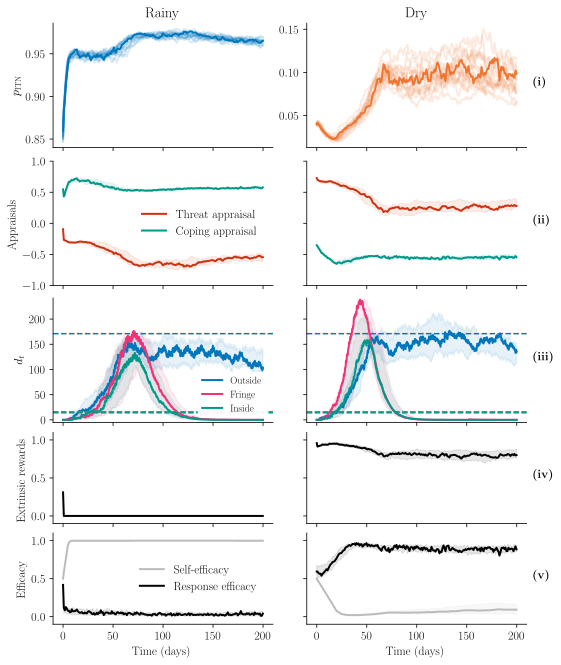

In [96]:
def plot_comb_influences_pmt(df, axs, c, title,
                             eff_cs=[cmap[6], cmap[7]], alpha_cs=[cmap[4], cmap[5]],
                             patch_colours=[cmap[1], cmap[3], cmap[5]], patch_labels=["Outside", "Fringe", "Inside"],
                             ylabs=False, max_susc=0):
    def hl_run_util(vals): return (np.min(vals, axis=0), np.max(vals, axis=0), run_similarity_orderings(vals)[0])
    
    # step 1: plot p_itn
    nonzero_idx = df[0]['prob_values'].nonzero()
    mins, maxs, run = hl_run_util(vals:=np.array([run['prob_values'][nonzero_idx] for run in df]))

    for r_no, r in enumerate(df):
        axs[0].plot(np.array(df[0]["time"])[nonzero_idx],
                r["prob_values"][nonzero_idx],
                color=c,
                lw=2,
                alpha=1 if run == r_no else .15)

    
    # step 2: plot appraisals
    for alpha_n, alpha_c, alpha_l in zip(["alpha_t", "alpha_c"], alpha_cs, ["Threat appraisal", "Coping appraisal"]):
        mins, maxs, _ = hl_run_util(vals:=np.array([run[alpha_n][nonzero_idx] for run in df]))
    
        axs[1].fill_between(np.array(df[0]["time"])[nonzero_idx],
                       mins,
                       maxs,
                       color=alpha_c,
                       alpha=.1)
        axs[1].plot(np.array(df[0]["time"])[nonzero_idx],
                 vals[run],
                 color=alpha_c,
                 lw = 2,
                 label=alpha_l)

    # step 3: plot susceptibility
    for patch_id, c in enumerate(patch_colours):
        mins, maxs, _ = hl_run_util(vals:=np.array([df[i]["s_t"][patch_id] for i in range(len(df))]))

        new_max = np.max(maxs)
        max_susc = new_max if new_max > max_susc else max_susc

        axs[2].fill_between(df[0]["time"],
                        mins,
                        maxs,
                        color=c,
                        alpha=.1)
        axs[2].plot(df[0]["time"],
                vals[run],
                color=c,
                linewidth=2,
                label=patch_labels[patch_id])
        axs[2].axhline(avg_patch_thresholds[patch_id],
                    color=c,
                        linestyle='dashed')
    
    
    # step 4: plot rewards
    mins, maxs, _ = hl_run_util(vals:=np.array([run['omega'][nonzero_idx] for run in df]))

    axs[3].fill_between(np.array(df[0]["time"])[nonzero_idx],
                   mins,
                   maxs,
                   color='black',
                   alpha=.1)
    axs[3].plot(np.array(df[0]["time"])[nonzero_idx],
             vals[run],
             color='black',
             lw = 2)

    # step 5: plot efficacies
    for eff_n, eff_c, eff_l in zip(["self_eff", "chi"], eff_cs, ["Self-efficacy", "Response efficacy"]):
        mins, maxs, _ = hl_run_util(vals:=np.array([run[eff_n][nonzero_idx] for run in df]))
    
        axs[4].fill_between(np.array(df[0]["time"])[nonzero_idx],
                       mins,
                       maxs,
                       color=eff_c,
                       alpha=.1)
        axs[4].plot(np.array(df[0]["time"])[nonzero_idx],
                 vals[run],
                 color=eff_c,
                 lw = 2,
                 label=eff_l)

    # set additional figure info
    axs[0].set_title(title)
    axs[1].set_ylim(-1,1)
    axs[3].set_ylim(-0.1,1.1)
    axs[4].set_ylim(-0.1,1.1)
    axs[4].set_xlabel(r"Time (days)")
    
    # set labs
    if ylabs:
        axs[0].set_ylabel(r"$p_{\mathrm{ITN}}$")
        
        axs[1].set_ylabel(r"Appraisals")
        axs[1].legend()

        axs[2].set_ylabel(r"$d_t$")
        
        axs[3].set_ylabel(r"Extrinsic rewards")
        axs[4].set_ylabel(r"Efficacy")
        axs[4].legend()
    else:
        axs[1].set_yticklabels([])
        axs[2].set_yticklabels([])
        axs[3].set_yticklabels([])
        axs[4].set_yticklabels([])

    return max_susc

# left = rainy
fig, laxs = plt.subplots(5, 2,
                         sharex='col', sharey=False,
                         figsize=(IDEAL_FIG_SIZE[0]*1.3, IDEAL_FIG_SIZE[1]*2.5),
                         height_ratios=[1.5, 1.5, 1.5, 1.1, 1.1])

max_susc = plot_comb_influences_pmt(pmt_data["rainy"], laxs[:,0], cmap[1], "Rainy", ylabs=True)
max_susc = plot_comb_influences_pmt(pmt_data["dry"], laxs[:,1], cmap[0], "Dry", ylabs=False, max_susc=max_susc)

laxs[2,0].set_ylim(-5, max_susc)
laxs[2,1].set_ylim(-5, max_susc)

laxs[2,0].legend(frameon=True,
                 edgecolor='white',
                 facecolor='white',
                 framealpha=.95,
                prop={'size': 10})

laxs[0,1].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
laxs[1,1].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")
laxs[2,1].annotate(r"\textbf{(iii)}", xy=(1.025, 0.5), xycoords="axes fraction")
laxs[3,1].annotate(r"\textbf{(iv)}", xy=(1.025, 0.5), xycoords="axes fraction")
laxs[4,1].annotate(r"\textbf{(v)}", xy=(1.025, 0.5), xycoords="axes fraction")

plt.savefig("figs/5-pmt-determinants.pdf") # TODO: reduce horizontal dimension; increase vertical; in figure caption explain the highlighted run is most representative

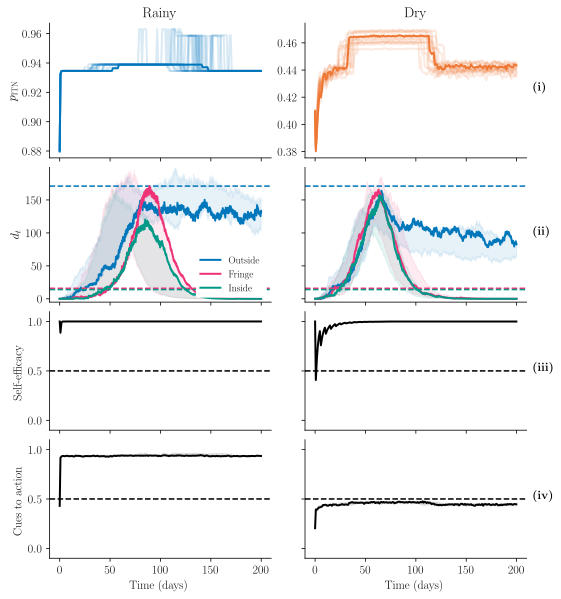

In [97]:
def plot_comb_influences_hbm(df, axs, c, title,
                             patch_colours=[cmap[1], cmap[3], cmap[5]],
                             patch_labels=["Outside", "Fringe", "Inside"],
                             ylabs=False, max_susc=0):
    def hl_run_util(vals): return (np.min(vals, axis=0), np.max(vals, axis=0), run_similarity_orderings(vals)[0])
    
    # step 1: plot p_itn
    nonzero_idx = df[0]['prob_values'].nonzero()
    mins, maxs, run = hl_run_util(vals:=np.array([run['prob_values'][nonzero_idx] for run in df]))

    for r_no, r in enumerate(df):
        axs[0].plot(np.array(df[0]["time"])[nonzero_idx],
                r["prob_values"][nonzero_idx],
                color=c,
                lw=2,
                alpha=1 if run == r_no else .15)

    # step 2: plot susceptibility
    for patch_id, c in enumerate(patch_colours):
        mins, maxs, _ = hl_run_util(vals:=np.array([df[i]["s_t"][patch_id] for i in range(len(df))]))
        
        new_max = np.max(maxs)
        max_susc = new_max if new_max > max_susc else max_susc

        axs[1].fill_between(df[0]["time"],
                        mins,
                        maxs,
                        color=c,
                        alpha=.1)
        axs[1].plot(df[0]["time"],
                vals[run],
                color=c,
                linewidth=2,
                label=patch_labels[patch_id])
        axs[1].axhline(avg_patch_thresholds[patch_id],
                    color=c,
                        linestyle='dashed')
    
    
    # step 3: plot self efficacy
    mins, maxs, _ = hl_run_util(vals:=np.array([run['self_eff'][nonzero_idx] for run in df]))
    axs[2].fill_between(np.array(df[0]["time"])[nonzero_idx],
                   mins,
                   maxs,
                   color='black',
                   alpha=.1)
    axs[2].plot(np.array(df[0]["time"])[nonzero_idx],
             vals[run],
             color='black',
             lw = 2)
    axs[2].axhline(.5, color='black', linestyle='dashed')

    # step 4: plot cues to action
    mins, maxs, _ = hl_run_util(vals:=np.array([run["omega"][nonzero_idx] for run in df]))

    axs[3].fill_between(np.array(df[0]["time"])[nonzero_idx],
                   mins,
                   maxs,
                   color='black',
                   alpha=.1)
    axs[3].plot(np.array(df[0]["time"])[nonzero_idx],
             vals[run],
             color='black',
             lw = 2)
    axs[3].axhline(0.5, color='black', linestyle='dashed')

    # set additional figure info
    axs[0].set_title(title)
    axs[3].set_xlabel(r"Time (days)")
    axs[2].set_ylim(-0.1,1.1)
    axs[3].set_ylim(-0.1,1.1)
    
    # set labs
    if ylabs:
        axs[0].set_ylabel(r"$p_{\mathrm{ITN}}$")
        
        axs[1].set_ylabel(r"$d_t$")
        axs[1].legend(frameon=True, edgecolor='white', facecolor='white', framealpha=1, prop={'size': 10}, loc='lower right')

        axs[2].set_ylabel(r"Self-efficacy")
        
        axs[3].set_ylabel(r"Cues to action")
    else:
        axs[1].set_yticklabels([])
        axs[2].set_yticklabels([])
        axs[3].set_yticklabels([])

    return max_susc

# left = rainy
fig, laxs = plt.subplots(4, 2,
                         sharex='col', sharey=False,
                         figsize=(IDEAL_FIG_SIZE[0]*1.3, IDEAL_FIG_SIZE[1]*2.25),
                         height_ratios=[1.25, 1.25, 1.1, 1.1])

max_susc = plot_comb_influences_hbm(hbm_data["rainy"], laxs[:,0], cmap[1], "Rainy", ylabs=True)
max_susc = plot_comb_influences_hbm(hbm_data["dry"], laxs[:,1], cmap[0], "Dry", ylabs=False, max_susc=max_susc)

laxs[1,0].set_ylim(-5, max_susc)
laxs[1,1].set_ylim(-5, max_susc)

laxs[0,1].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
laxs[1,1].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")
laxs[2,1].annotate(r"\textbf{(iii)}", xy=(1.025, 0.5), xycoords="axes fraction")
laxs[3,1].annotate(r"\textbf{(iv)}", xy=(1.025, 0.5), xycoords="axes fraction")

plt.savefig("figs/6-hbm-determinants.pdf")

### Infections across risk groups

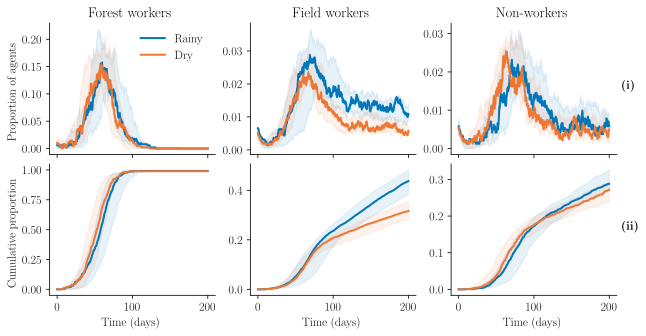

In [98]:
fig, axs = plt.subplots(nrows=2, ncols=3,
                        sharex=True,# sharey='row',
                        figsize=(IDEAL_FIG_SIZE[0]*1.5, IDEAL_FIG_SIZE[1]*1.25))

def plot_row(dfs, axs, colors, legend=0):
    for row_no, (method, row) in enumerate(zip(('prop', 'cum'), axs)):
        for i, (risk_group, ax) in enumerate(zip(
                                                ["Forest workers", "Field workers", "Non-workers"],
                                                row)):
            for df, c, lab in zip(dfs,
                                              colors,
                                              ["Rainy", "Dry"]):
                
                if method == 'cum':
                    vals = np.array([run["agent_infected_unique"][i].cumsum()/run['amts'][i] for run in df])
                else:
                    vals = np.array([run["agent_disease_counts"][i][2]/run['amts'][i] for run in df])
    
                mins = np.min(vals, axis=0)
                maxs = np.max(vals, axis=0)
                hl_run = run_similarity_orderings(vals)[0]
                
                ax.fill_between(df[0]["time"],
                                       mins,
                                       maxs,
                                       color=c,
                                       alpha=.1)
    
                ax.plot(df[0]["time"],
                             vals[hl_run],
                             color=c,
                             lw = 2,
                             label=lab if (row_no,i) == legend_ax else None)
    
                if row_no == 0:
                    ax.set_title(risk_group)
                else:
                    ax.set_xlabel("Time (days)")
                        
legend_ax = (0,0)

plot_row([hbm_data['rainy'], hbm_data['dry']], axs, colors=[cmap[1], cmap[0]], legend=legend_ax)
axs[0,0].set_ylabel("Proportion of agents")
axs[1,0].set_ylabel("Cumulative proportion")
axs[*legend_ax].legend()

axs[0,2].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
axs[1,2].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")

plt.savefig("figs/7-hbm-risk-groups.pdf") # move to appendix

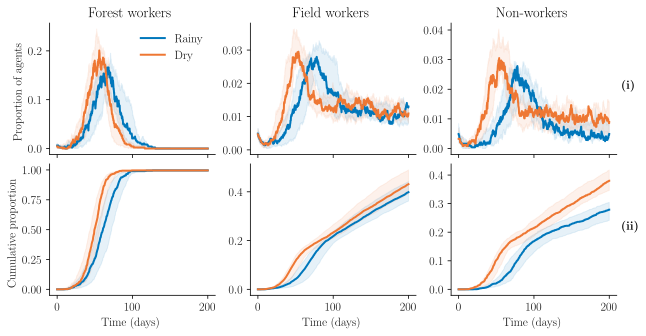

In [99]:
fig, axs = plt.subplots(nrows=2, ncols=3,
                        sharex=True,# sharey='row',
                        figsize=(IDEAL_FIG_SIZE[0]*1.5, IDEAL_FIG_SIZE[1]*1.25))

def plot_row(dfs, axs, colors, legend=0):
    for row_no, (method, row) in enumerate(zip(('prop', 'cum'), axs)):
        for i, (risk_group, ax) in enumerate(zip(
                                                ["Forest workers", "Field workers", "Non-workers"],
                                                row)):
            for df, c, lab in zip(dfs,
                                              colors,
                                              ["Rainy", "Dry"]):
                
                if method == 'cum':
                    vals = np.array([run["agent_infected_unique"][i].cumsum()/run['amts'][i] for run in df])
                else:
                    vals = np.array([run["agent_disease_counts"][i][2]/run['amts'][i] for run in df])
    
                mins = np.min(vals, axis=0)
                maxs = np.max(vals, axis=0)
                hl_run = run_similarity_orderings(vals)[0]
                
                ax.fill_between(df[0]["time"],
                                       mins,
                                       maxs,
                                       color=c,
                                       alpha=.1)
    
                ax.plot(df[0]["time"],
                             vals[hl_run],
                             color=c,
                             lw = 2,
                             label=lab if (row_no,i) == legend_ax else None)
    
                if row_no == 0:
                    ax.set_title(risk_group)
                else:
                    ax.set_xlabel("Time (days)")
                        
legend_ax = (0,0)

plot_row([pmt_data['rainy'], pmt_data['dry']], axs, colors=[cmap[1], cmap[0]], legend=legend_ax)
axs[0,0].set_ylabel("Proportion of agents")
axs[1,0].set_ylabel("Cumulative proportion")
axs[*legend_ax].legend()

axs[0,2].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
axs[1,2].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")

plt.savefig("figs/8-pmt-risk-groups.pdf") # move to appendix

## 2 Varying perceived severity

Only simulate new scenarios: i.e., low severity in rainy for HBM + PMT; high severity in dry for HBM + PMT = 4 total

In [15]:
# HBM
RAINY_HBM_LOW  = RAINY_SEASON_HBM.copy()
RAINY_HBM_LOW.update({
    "high_severity": False,
})

DRY_HBM_HIGH  = DRY_SEASON_HBM.copy()
DRY_HBM_HIGH.update({
    "high_severity": True,
})

# PMT
RAINY_PMT_LOW  = RAINY_SEASON_PMT.copy()
RAINY_PMT_LOW.update({
    "high_severity": False,
})

DRY_PMT_HIGH  = DRY_SEASON_PMT.copy()
DRY_PMT_HIGH.update({
    "high_severity": True,
})

In [16]:
hbm_ex2_data = run_model(ModelHBM, 12, ['rainy_low', 'dry_high'], [RAINY_HBM_LOW, DRY_HBM_HIGH])

Running scenario 'rainy_low'...


100%|███████████████████████████████████████████████████████████████████████████| 12/12 [18:16<00:00, 91.41s/it]


Running scenario 'dry_high'...


100%|███████████████████████████████████████████████████████████████████████████| 12/12 [18:21<00:00, 91.81s/it]


In [17]:
pmt_ex2_data = run_model(ModelPMT, 12, ['rainy_low', 'dry_high'], [RAINY_PMT_LOW, DRY_PMT_HIGH])

Running scenario 'rainy_low'...


100%|██████████████████████████████████████████████████████████████████████████| 12/12 [37:09<00:00, 185.80s/it]


Running scenario 'dry_high'...


100%|██████████████████████████████████████████████████████████████████████████| 12/12 [35:23<00:00, 176.92s/it]


### P(behaviour) per BCT per scenario

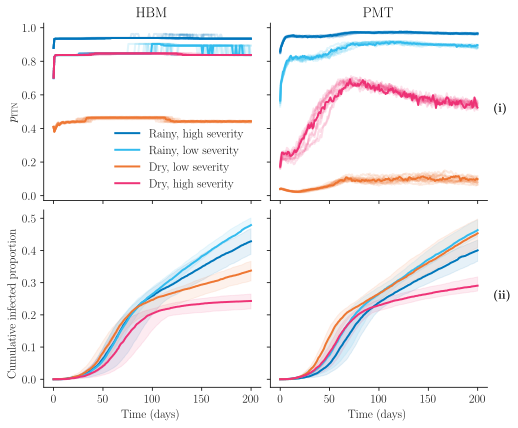

In [100]:
def plot_ex2_p_beh(ax, df, colours, names):
    for i, (scen, c, lab) in enumerate(zip(df, colours, names)):
        # p itn
        nonzero_idx = scen[0]['prob_values'].nonzero()
        vals = np.array([run['prob_values'][nonzero_idx] for run in scen])

        mins = np.min(vals, axis=0)
        maxs = np.max(vals, axis=0)
        hl_run = run_similarity_orderings(vals)[0]

        for r_no, run in enumerate(scen):
            ax[0].plot(np.array(scen[0]["time"])[nonzero_idx],
                    run["prob_values"][nonzero_idx],
                    color=c,
                    lw=2,
                    # linestyle="dashed" if i > 1 else None,
                    alpha=1 if hl_run == r_no else .15,
                    label=lab if hl_run == r_no else None)

        # cum infs
        vals = np.array([run["agent_infected_unique"][0:3].sum(axis=0).cumsum()/10053 for run in scen])

        mins = np.min(vals, axis=0)
        maxs = np.max(vals, axis=0)
        hl_run = run_similarity_orderings(vals)[0]
        
        ax[1].fill_between(scen[0]["time"],
                               mins,
                               maxs,
                               color=c,
                               alpha=.1)

        ax[1].plot(scen[0]["time"],
                     vals[hl_run],
                     color=c,
                     lw = 2)


fig, axs = plt.subplots(nrows=2, ncols=2, sharey='row', sharex=True, figsize=(IDEAL_FIG_SIZE[0]*1.2, IDEAL_FIG_SIZE[1]*1.6))

plot_ex2_p_beh(axs[:, 0],
               [hbm_data["rainy"], hbm_ex2_data["rainy_low"], hbm_data["dry"], hbm_ex2_data["dry_high"]],
               [cmap[1],cmap[2],cmap[0],cmap[3]],
               ["Rainy, high severity", "Rainy, low severity","Dry, low severity", "Dry, high severity"])
plot_ex2_p_beh(axs[:, 1],
               [pmt_data["rainy"], pmt_ex2_data["rainy_low"], pmt_data["dry"], pmt_ex2_data["dry_high"]],
               [cmap[1],cmap[2],cmap[0],cmap[3]],
               ["Rainy, high severity", "Rainy, low severity","Dry, low severity", "Dry, high severity"])

axs[0,0].legend(loc='lower right')

axs[0,0].set_title("HBM")
axs[0,1].set_title("PMT")

axs[0,0].set_ylabel(r"$p_{\mathrm{ITN}}$")
axs[1,0].set_ylabel(r"Cumulative infected proportion")
axs[1,0].set_xlabel("Time (days)")
axs[1,1].set_xlabel("Time (days)")

axs[0,1].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
axs[1,1].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")

plt.savefig("figs/ex2-p-beh.pdf") # extend with below plot

### Cumulative infections across entire population

In [101]:
# def plot_ex2_cum_infs(ax, scen, colours, names):
#     for i, (scen, c, lab) in enumerate(zip(scen, colours, names)):
#         vals = np.array([run["agent_infected_unique"][0:3].sum(axis=0).cumsum()/10053 for run in scen])

#         mins = np.min(vals, axis=0)
#         maxs = np.max(vals, axis=0)
#         hl_run = run_similarity_orderings(vals)[0]
        
#         ax.fill_between(scen[0]["time"],
#                                mins,
#                                maxs,
#                                color=c,
#                                alpha=.1)

#         ax.plot(scen[0]["time"],
#                      vals[hl_run],
#                      color=c,
#                      lw = 2,
#                      label=lab)

# fig, axs = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(IDEAL_FIG_SIZE[0]*1, IDEAL_FIG_SIZE[1]*1.2))

# plot_ex2_cum_infs(axs[0],
#                [hbm_data["rainy"], hbm_ex2_data["rainy_low"], hbm_data["dry"], hbm_ex2_data["dry_high"]],
#                [cmap[1],cmap[2],cmap[0],cmap[3]],
#                ["Rainy, high severity", "Rainy, low severity","Dry, low severity", "Dry, high severity"])
# plot_ex2_cum_infs(axs[1],
#                [pmt_data["rainy"], pmt_ex2_data["rainy_low"], pmt_data["dry"], pmt_ex2_data["dry_high"]],
#                [cmap[1],cmap[2],cmap[0],cmap[3]],
#                ["Rainy, high severity", "Rainy, low severity","Dry, low severity", "Dry, high severity"])

# axs[0].legend(loc='lower right')

# axs[0].set_title("HBM")
# axs[1].set_title("PMT")

# axs[0].set_ylabel(r"Cumulative proportion of infected agents")
# axs[0].set_xlabel("Time (days)")
# axs[1].set_xlabel("Time (days)")

#plt.savefig("figs/ex2-cum-infs.pdf") # TODO: put this under the above plot

### Infections across risk groups

Just looking at dry scenario for PMT (/HBM?)

0.0
0.0
0.0
69.58333333333374
0.0
0.0


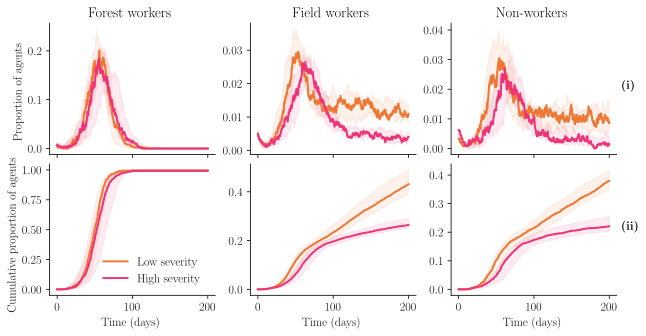

In [102]:
fig, axs = plt.subplots(nrows=2, ncols=3,
                        sharex=True,# sharey='row',
                        figsize=(IDEAL_FIG_SIZE[0]*1.5, IDEAL_FIG_SIZE[1]*1.25))

def plot_row(dfs, axs, colors, legend=0):
    for row_no, (method, row) in enumerate(zip(('prop', 'cum'), axs)):
        for i, (risk_group, ax) in enumerate(zip(
                                                ["Forest workers", "Field workers", "Non-workers"],
                                                row)):
            for df, c, lab in zip(dfs,
                                              colors,
                                              ["Low severity", "High severity"]):
                
                if method == 'cum':
                    vals = np.array([run["agent_infected_unique"][i].cumsum()/run['amts'][i] for run in df])
                else:
                    vals = np.array([run["agent_disease_counts"][i][2]/run['amts'][i] for run in df])
    
                mins = np.min(vals, axis=0)
                maxs = np.max(vals, axis=0)
                hl_run = run_similarity_orderings(vals)[0]
                
                ax.fill_between(df[0]["time"],
                                       mins,
                                       maxs,
                                       color=c,
                                       alpha=.1)
    
                ax.plot(df[0]["time"],
                             vals[hl_run],
                             color=c,
                             lw = 2,
                             label=lab if (row_no,i) == legend_ax else None)

                if lab == "Low severity": print(df[0]["time"][np.argmax(vals[hl_run] > 0.95)])
    
                if row_no == 0:
                    ax.set_title(risk_group)
                else:
                    ax.set_xlabel("Time (days)")
                        
legend_ax = (1,0)

plot_row([pmt_data['dry'], pmt_ex2_data['dry_high']], axs, colors=[cmap[0],cmap[3]], legend=legend_ax)
axs[0,0].set_ylabel("Proportion of agents")
axs[1,0].set_ylabel("Cumulative proportion of agents")
axs[*legend_ax].legend()

axs[0,2].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
axs[1,2].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")

plt.savefig("figs/ex2-occupations.pdf") # move to appendix;

## 3 Self-efficacy sensitivity

Simulate default self-efficacy in [0, 0.5, 1] across the ONE BCT in ONE scenario to see how perceived confidence can alter preventive behaviours &rarr; choose the scenario from the one that self-efficacy.

In [21]:
# zero efficacy
DRY_PMT_0  = DRY_SEASON_PMT.copy()
DRY_PMT_0.update({
    "init_itn_score": 0,
})

# 1/2 efficacy
DRY_PMT_5  = DRY_SEASON_PMT.copy()
DRY_PMT_5.update({
    "init_itn_score": 5,
})

# full efficacy
DRY_PMT_10  = DRY_SEASON_PMT.copy()
DRY_PMT_10.update({
    "init_itn_score": 10,
})

In [22]:
pmt_ex3_data = run_model(ModelPMT, 12, ['0', '50', "100"], [DRY_PMT_0, DRY_PMT_5, DRY_PMT_10])

Running scenario '0'...


100%|██████████████████████████████████████████████████████████████████████████| 12/12 [35:28<00:00, 177.39s/it]


Running scenario '50'...


100%|██████████████████████████████████████████████████████████████████████████| 12/12 [35:24<00:00, 177.05s/it]


Running scenario '100'...


100%|██████████████████████████████████████████████████████████████████████████| 12/12 [35:18<00:00, 176.58s/it]


### Comparing p_beh (top) vs self-eff (bottom)

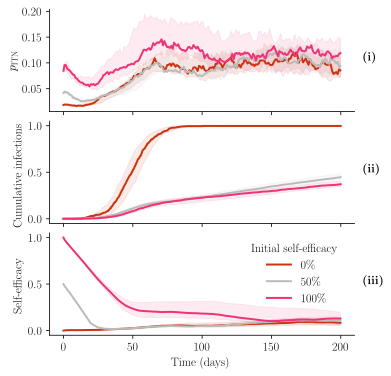

In [112]:
fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(IDEAL_FIG_SIZE[0]*.9, IDEAL_FIG_SIZE[1]*1.4))

for i, (df, c, lab) in enumerate(zip(pmt_ex3_data.values(), [cmap[4], cmap[6], cmap[3]], ["0\%", "50\%", "100\%"])):
    # p-beh
    nonzero_idx = df[0]['prob_values'].nonzero()
    vals = np.array([run['prob_values'][nonzero_idx] for run in df])

    mins = np.min(vals, axis=0)
    maxs = np.max(vals, axis=0)
    hl_run = run_similarity_orderings(vals)[0]

    axs[0].fill_between(np.array(df[0]["time"])[nonzero_idx],
                   mins,
                   maxs,
                   color=c,
                   alpha=.1)
    axs[0].plot(np.array(df[0]["time"])[nonzero_idx],
             vals[hl_run],
             color=c,
             lw = 2,
                label=lab)

    # cum infs
    vals = np.array([df[r]["agent_infected_unique"][i].cumsum()/df[r]['amts'][i] for r in range(len(df))])

    mins = np.min(vals, axis=0)
    maxs = np.max(vals, axis=0)
    hl_run = run_similarity_orderings(vals)[0]
    
    axs[1].fill_between(df[0]["time"],
                   mins,
                   maxs,
                   color=c,
                   alpha=.1)
    axs[1].plot(df[0]["time"],
             vals[hl_run],
             color=c,
             lw = 2)
    
    # s-eff
    vals = np.array([run['self_eff'][nonzero_idx] for run in df])

    mins = np.min(vals, axis=0)
    maxs = np.max(vals, axis=0)
    hl_run = run_similarity_orderings(vals)[0]
    
    axs[2].fill_between(np.array(df[0]["time"])[nonzero_idx],
                   mins,
                   maxs,
                   color=c,
                   alpha=.1)
    axs[2].plot(np.array(df[0]["time"])[nonzero_idx],
             vals[hl_run],
             color=c,
             lw = 2,
                label=lab)

axs[2].legend(title=r"Initial self-efficacy")

axs[0].set_ylabel(r"$p_{\mathrm{ITN}}$")
axs[1].set_ylabel(r"Cumulative infections")
axs[2].set_ylabel(r"Self-efficacy")

axs[2].set_xlabel("Time (days)")

axs[0].annotate(r"\textbf{(i)}", xy=(1.025, 0.5), xycoords="axes fraction")
axs[1].annotate(r"\textbf{(ii)}", xy=(1.025, 0.5), xycoords="axes fraction")
axs[2].annotate(r"\textbf{(iii)}", xy=(1.025, 0.5), xycoords="axes fraction")

# plt.savefig("figs/ex2-p-beh.pdf")
plt.savefig("figs/ex3-p-itn.pdf") # p_itn first, then cum infs, then self-eff

### Infections & cum infections

0\% 0.0691699604743083
0\% 0.9980237154150198
74.91666666666677
50\% 0.017436183568140605
50\% 0.4469591780061094
100\% 0.017971246006389777
100\% 0.3710063897763578
0.1713258785942492


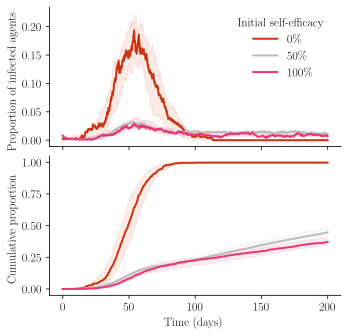

In [106]:
from matplotlib.ticker import FormatStrFormatter
fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(IDEAL_FIG_SIZE[0]*.8, IDEAL_FIG_SIZE[1]*1.25))

for i, (df, c, lab) in enumerate(zip(pmt_ex3_data.values(), [cmap[4], cmap[6], cmap[3]], ["0\%", "50\%", "100\%"])):
    # infs
    vals = np.array([df[r]["agent_disease_counts"][i][2]/df[r]['amts'][i] for r in range(len(df))])

    mins = np.min(vals, axis=0)
    maxs = np.max(vals, axis=0)
    hl_run = run_similarity_orderings(vals)[0]

    axs[0].fill_between(df[0]["time"],
                   mins,
                   maxs,
                   color=c,
                   alpha=.1)
    axs[0].plot(df[0]["time"],
             vals[hl_run],
             color=c,
             lw = 2,
                label=lab)

    print(lab, vals[hl_run][int(75 * (24/2))])

    # cum infs
    vals = np.array([df[r]["agent_infected_unique"][i].cumsum()/df[r]['amts'][i] for r in range(len(df))])

    mins = np.min(vals, axis=0)
    maxs = np.max(vals, axis=0)
    hl_run = run_similarity_orderings(vals)[0]
    
    axs[1].fill_between(df[0]["time"],
                   mins,
                   maxs,
                   color=c,
                   alpha=.1)
    axs[1].plot(df[0]["time"],
             vals[hl_run],
             color=c,
             lw = 2,
                label=lab)

    # print(lab, vals[hl_run][int(75 * (24/2))])
    print(lab, vals[hl_run][-1])
    if lab == "0\%": print(df[0]["time"][np.argmax(vals[hl_run] > 0.95)])
    if lab == "100\%": print(vals[hl_run][72*12])

axs[0].legend(title=r"Initial self-efficacy")

axs[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

axs[0].set_ylabel(r"Proportion of infected agents")
axs[1].set_ylabel(r"Cumulative proportion")

axs[1].set_xlabel("Time (days)")

plt.savefig("figs/ex3-infs.pdf") # remove

## Graveyard

0.9588888055353845
0.9780779898120937
0.4624206953575438
0.14090687161896068


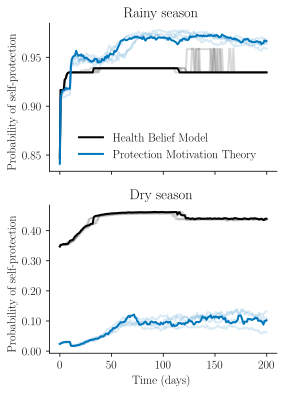

In [39]:
from matplotlib.ticker import FormatStrFormatter
fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(IDEAL_FIG_SIZE[0]*.65, IDEAL_FIG_SIZE[1]*1.5))

def plot_p_behaviour_cis(dfs, ax, colours, names):
    for name, df, c in zip(names, dfs.values(), colours):
        nonzero_idx = df[0]['prob_values'].nonzero()
        vals = np.array([run['prob_values'][nonzero_idx] for run in df])

        mins = np.min(vals, axis=0)
        maxs = np.max(vals, axis=0)
        hl_run = run_similarity_orderings(vals)[0]

        print(np.max(maxs))

        for r_no, run in enumerate(df):
            ax.plot(np.array(df[0]["time"])[nonzero_idx],
                    run["prob_values"][nonzero_idx],
                    color=c,
                    lw=2,
                    # lw=2 if hl_run == r_no else 1,
                    alpha=1 if hl_run == r_no else .15,
                    label=name if hl_run == r_no else None)
                    

        # ax.plot(np.array(df[0]["time"])[nonzero_idx],
        #          vals[hl_run],
        #          color=c,
        #          lw = 2,
        #          label=name)

plot_p_behaviour_cis({"1": hbm_data["rainy"], "2": pmt_data["rainy"]}, axs[0], [cmap[7], cmap[1]], ["Health Belief Model", "Protection Motivation Theory"])
plot_p_behaviour_cis({"1": hbm_data["dry"], "2": pmt_data["dry"]}, axs[1], [cmap[7], cmap[1]], [None, None])

axs[1].set_xlabel("Time (days)")
axs[0].set_ylabel(r"Probability of self-protection")
axs[1].set_ylabel(r"Probability of self-protection")

axs[0].set_title("Rainy season")
axs[1].set_title("Dry season")

axs[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
axs[1].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

fig.get_layout_engine().set(h_pad=.1)# / 72, h_pad=4 / 72, hspace=0, wspace=0)

axs[0].legend(loc='lower right')
# plt.savefig("figs/1-p-behaviour.pdf")
plt.savefig("cis-colloquium-plot.pdf")

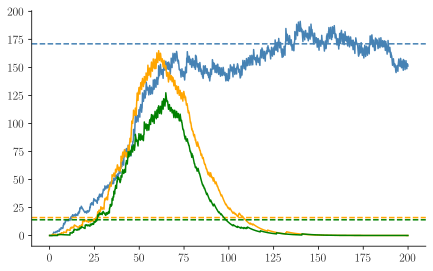

In [67]:
# append s_ts to data
delta_val = .99

def append_s_t_data(data):
    for df in data.values():
        for run in df:
        counts = pd.DataFrame(hbm_data["rainy"][0]["infection_records"])[["time", "home_patch"]].groupby(['time', 'home_patch']).size().reset_index(name='counts')

c_t = np.zeros((3,2400))
for p in range(3):
    p_counts = counts[counts.home_patch == p]
    c_t[p, p_counts.time.to_numpy()] = p_counts.counts

# p0 = counts[counts.home_patch == 0]
# infs_p0 = np.zeros(2400)
# infs_p0[p0.time.to_numpy()] = p0.counts

for patch_id, c in enumerate(['steelblue', 'orange', 'green']):
    c_ts = [np.sum([(delta_val**i)*(c_t[patch_id][j-i-1]) for i in range(j)]) for j in range(2400)]
    plt.plot(hbm_data["rainy"][0]['time'], c_ts, color=c)
    plt.axhline([171, 16, 14][patch_id], color=c, linestyle='dashed') #label=r"$\lambda^{({"+str(patch_id)+r"})}$")